# Blood Vessel Segmentation In RGB Retinal Images
Hamidreza Rashidy Kanan  
2022

## 1. Import Required Libraries

In [1]:
import numpy as np
import pathlib
import os
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import random
import skimage
from skimage import io
from skimage.filters import sato, frangi, hessian, meijering, median
from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

## 2. Load the Training Input Images (DRIVE Database)

In [2]:
# Load the training input images

basic_path_input_training = os.path.abspath(r"/Users/zaynab/Mantis_Photonics/Hamidreza/Images/DRIVE/training/images")

filenames_input_training = [f for f in sorted(os.listdir(basic_path_input_training)) if f.endswith('.tif')]

print(f'We have got a list of {len(filenames_input_training)} input training images.')


imgs_input_training = np.zeros((584,565,3,20))


for i, filename_input_training in enumerate(filenames_input_training):
    imgs_input_training[:,:,:,i]= io.imread(os.path.join(basic_path_input_training, filename_input_training))
    print(f'{i}\tfile: {filename_input_training} filesize : {imgs_input_training[:,:,:,i].shape}')
imgs_input_training.shape




# Load the test input images

basic_path_input_test = os.path.abspath(r"/Users/zaynab/Mantis_Photonics/Hamidreza/Images/DRIVE/test/images")

filenames_input_test = [f for f in sorted(os.listdir(basic_path_input_test)) if f.endswith('.tif')]

print(f'We have got a list of {len(filenames_input_test)} input test images.')


imgs_input_test = np.zeros((584,565,3,20))


for i, filename_input_test in enumerate(filenames_input_test):
    imgs_input_test[:,:,:,i]= io.imread(os.path.join(basic_path_input_test, filename_input_test))
    print(f'{i}\tfile: {filename_input_test} filesize : {imgs_input_test[:,:,:,i].shape}')
imgs_input_test.shape

We have got a list of 20 input training images.
0	file: 21_training.tif filesize : (584, 565, 3)
1	file: 22_training.tif filesize : (584, 565, 3)
2	file: 23_training.tif filesize : (584, 565, 3)
3	file: 24_training.tif filesize : (584, 565, 3)
4	file: 25_training.tif filesize : (584, 565, 3)
5	file: 26_training.tif filesize : (584, 565, 3)
6	file: 27_training.tif filesize : (584, 565, 3)
7	file: 28_training.tif filesize : (584, 565, 3)
8	file: 29_training.tif filesize : (584, 565, 3)
9	file: 30_training.tif filesize : (584, 565, 3)
10	file: 31_training.tif filesize : (584, 565, 3)
11	file: 32_training.tif filesize : (584, 565, 3)
12	file: 33_training.tif filesize : (584, 565, 3)
13	file: 34_training.tif filesize : (584, 565, 3)
14	file: 35_training.tif filesize : (584, 565, 3)
15	file: 36_training.tif filesize : (584, 565, 3)
16	file: 37_training.tif filesize : (584, 565, 3)
17	file: 38_training.tif filesize : (584, 565, 3)
18	file: 39_training.tif filesize : (584, 565, 3)
19	file: 40_

(584, 565, 3, 20)

## 3. Load the Training Ground Truth Images (DRIVE Database)

In [3]:
# Load the training ground truth images

basic_path_gtruth_training = os.path.abspath(r"/Users/zaynab/Mantis_Photonics/Hamidreza/Images/DRIVE/training/1st_manual")

filenames_gtruth_training = [f for f in sorted(os.listdir(basic_path_gtruth_training)) if f.endswith('.gif')]

print(f'We have got a list of {len(filenames_gtruth_training)} ground truth training images.')


imgs_gtruth_training = np.zeros((584,565,20))


for i, filename_gtruth_training in enumerate(filenames_gtruth_training):
    imgs_gtruth_training[:,:,i]= io.imread(os.path.join(basic_path_gtruth_training, filename_gtruth_training))
    print(f'{i}\tfile: {filename_gtruth_training} filesize : {imgs_gtruth_training[:,:,i].shape}')
imgs_gtruth_training.shape


# Load the test ground truth images

basic_path_gtruth_test = os.path.abspath(r"/Users/zaynab/Mantis_Photonics/Hamidreza/Images/DRIVE/test/1st_manual")

filenames_gtruth_test = [f for f in sorted(os.listdir(basic_path_gtruth_test)) if f.endswith('.gif')]

print(f'We have got a list of {len(filenames_gtruth_test)} ground truth test images.')


imgs_gtruth_test = np.zeros((584,565,20))


for i, filename_gtruth_test in enumerate(filenames_gtruth_test):
    imgs_gtruth_test[:,:,i]= io.imread(os.path.join(basic_path_gtruth_test, filename_gtruth_test))
    print(f'{i}\tfile: {filename_gtruth_test} filesize : {imgs_gtruth_test[:,:,i].shape}')
imgs_gtruth_test.shape

We have got a list of 20 ground truth training images.
0	file: 21_manual1.gif filesize : (584, 565)
1	file: 22_manual1.gif filesize : (584, 565)
2	file: 23_manual1.gif filesize : (584, 565)
3	file: 24_manual1.gif filesize : (584, 565)
4	file: 25_manual1.gif filesize : (584, 565)
5	file: 26_manual1.gif filesize : (584, 565)
6	file: 27_manual1.gif filesize : (584, 565)
7	file: 28_manual1.gif filesize : (584, 565)
8	file: 29_manual1.gif filesize : (584, 565)
9	file: 30_manual1.gif filesize : (584, 565)
10	file: 31_manual1.gif filesize : (584, 565)
11	file: 32_manual1.gif filesize : (584, 565)
12	file: 33_manual1.gif filesize : (584, 565)
13	file: 34_manual1.gif filesize : (584, 565)
14	file: 35_manual1.gif filesize : (584, 565)
15	file: 36_manual1.gif filesize : (584, 565)
16	file: 37_manual1.gif filesize : (584, 565)
17	file: 38_manual1.gif filesize : (584, 565)
18	file: 39_manual1.gif filesize : (584, 565)
19	file: 40_manual1.gif filesize : (584, 565)
We have got a list of 20 ground tru

(584, 565, 20)

## 4. Load the Training Mask Images (DRIVE Database)

In [4]:
# Load the training mask images

basic_path_mask_training = os.path.abspath(r"/Users/zaynab/Mantis_Photonics/Hamidreza/Database/DRIVE--Digital-Retinal-Images-for-Vessel-Extraction/DRIVE/training/mask")

filenames_mask_training = [f for f in sorted(os.listdir(basic_path_mask_training)) if f.endswith('.gif')]

print(f'We have got a list of {len(filenames_mask_training)} mask training images.')


imgs_mask_training = np.zeros((584,565,20))


for i, filename_mask_training in enumerate(filenames_mask_training):
    imgs_mask_training[:,:,i]= io.imread(os.path.join(basic_path_mask_training, filename_mask_training))
    print(f'{i}\tfile: {filename_mask_training} filesize : {imgs_mask_training[:,:,i].shape}')
imgs_mask_training.shape


# Load the test mask images

basic_path_mask_test = os.path.abspath(r"/Users/zaynab/Mantis_Photonics/Hamidreza/Database/DRIVE--Digital-Retinal-Images-for-Vessel-Extraction/DRIVE/test/mask")

filenames_mask_test = [f for f in sorted(os.listdir(basic_path_mask_test)) if f.endswith('.gif')]

print(f'We have got a list of {len(filenames_mask_test)} mask test images.')


imgs_mask_test = np.zeros((584,565,20))


for i, filename_mask_test in enumerate(filenames_mask_test):
    imgs_mask_test[:,:,i]= io.imread(os.path.join(basic_path_mask_test, filename_mask_test))
    print(f'{i}\tfile: {filename_mask_test} filesize : {imgs_mask_test[:,:,i].shape}')
imgs_mask_test.shape

We have got a list of 20 mask training images.
0	file: 21_training_mask.gif filesize : (584, 565)
1	file: 22_training_mask.gif filesize : (584, 565)
2	file: 23_training_mask.gif filesize : (584, 565)
3	file: 24_training_mask.gif filesize : (584, 565)
4	file: 25_training_mask.gif filesize : (584, 565)
5	file: 26_training_mask.gif filesize : (584, 565)
6	file: 27_training_mask.gif filesize : (584, 565)
7	file: 28_training_mask.gif filesize : (584, 565)
8	file: 29_training_mask.gif filesize : (584, 565)
9	file: 30_training_mask.gif filesize : (584, 565)
10	file: 31_training_mask.gif filesize : (584, 565)
11	file: 32_training_mask.gif filesize : (584, 565)
12	file: 33_training_mask.gif filesize : (584, 565)
13	file: 34_training_mask.gif filesize : (584, 565)
14	file: 35_training_mask.gif filesize : (584, 565)
15	file: 36_training_mask.gif filesize : (584, 565)
16	file: 37_training_mask.gif filesize : (584, 565)
17	file: 38_training_mask.gif filesize : (584, 565)
18	file: 39_training_mask.g

(584, 565, 20)

## 5. Preprocessing

In [6]:
def data_preprocess(imgs):
    imgs = rgb2gray(imgs)
    # imgs = normalization(imgs)
    imgs = clahe_equalized(imgs)
    # imgs = adjust_gamma(imgs, 1.2)
    imgs = imgs/255.  
    return imgs

# Convert RGB image to grayscale
def rgb2gray(imgs):
    imgs_gray = np.zeros((584,565,20))
    for i in range(imgs.shape[3]):
        imgs_gray[:,:,i] = imgs[:,:,0,i] * 0.299 + imgs[:,:,1,i] * 0.587 + imgs[:,:,2,i] * 0.114
    return imgs_gray

# Z-score and min-max normalization of dataset
def normalization(imgs):
    imgs_normalized = np.zeros((584,565,20))
    #imgs_normalized = np.empty(imgs.shape)
    for i in range(imgs.shape[2]):
        std = np.std(imgs[:,:,i])
        mean = np.mean(imgs[:,:,i])
        imgs_normalized[:,:,i] = (imgs[:,:,i] - mean) / std
    return imgs_normalized
#     for i in range(imgs.shape[0]):
#         imgs_max = np.max(imgs_normalized[i])
#         imgs_min = np.min(imgs_normalized[i])
#         imgs_normalized[i] = ((imgs_normalized[i] - imgs_min) / (imgs_max-np.min(imgs_normalized[i])))
        
#     imgs_normalized = imgs_normalized * 255
#     return imgs_normalized

# CLAHE (Contrast Limited Adaptive Histogram Equalization)
def clahe_equalized(imgs):
    imgs_clahe = np.zeros((584,565,20))
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    for i in range(imgs.shape[2]):
        imgs_clahe[:,:,i] = clahe.apply(imgs[:,:,i].astype(np.uint8))
    return imgs_clahe

# Gamma Correction
def adjust_gamma(imgs, gamma=1.0):
    invGamma = 1.0 / gamma
    imgs_adjust = np.zeros((584,565,20))
    table = []
    for i in range(256):
        table.append(((i / 255.0) ** invGamma) * 255)
    table = np.array(table).astype(np.uint8)
    for i in range(imgs.shape[2]):
        imgs_adjust[:,:,i] = cv2.LUT(imgs_adjust[:,:,i].astype(np.uint8), table)
    return imgs_adjust

## 6. Vesselness Enhancement Using Frangi Filter

In [8]:
def detect_ridges(gray, sigma=0.01):

    i1 = frangi(gray, sigmas=1, alpha=1, beta=1, black_ridges=True, mode='reflect', cval=0)
    return i1

## 7. Image Normalization

In [9]:
def normalize_image(image):
    return cv2.convertScaleAbs(cv2.normalize(image, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX))

## 8. Blood Vessel Segmentation

In [10]:
def segment_veins(image: np.ndarray, sigma: float = 1, C: float = -1, blocksize: int = 5, reduce: bool = True, ridge: bool = True, min_size: int = 50):

    i1 = detect_ridges(image, sigma=sigma)
    threshold1 = cv2.adaptiveThreshold(
        normalize_image(i1),
        255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV,
        blockSize=blocksize,
        C=C) if ridge else cv2.adaptiveThreshold(
        255 - normalize_image(image),
        255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV,
        blockSize=blocksize,
        C=C)

    threshold1 = 255 - threshold1
    
    im_with_separated_blobs = None
    if reduce:
        nb_blobs, im_with_separated_blobs, stats, _ = cv2.connectedComponentsWithStats(threshold1)
        sizes = stats[:, -1]
        sizes = sizes[1:]
        nb_blobs -= 1
        im_result = np.zeros((threshold1.shape))
        # for every component in the image, keep it only if it's above min_size
        blob_counter = 1
        for blob in range(nb_blobs):
            if sizes[blob] >= min_size:
                # see description of im_with_separated_blobs above
                im_result[im_with_separated_blobs == blob + 1] = blob_counter
                blob_counter += 1
        threshold1 = im_result
    return threshold1

## 9. Visualization

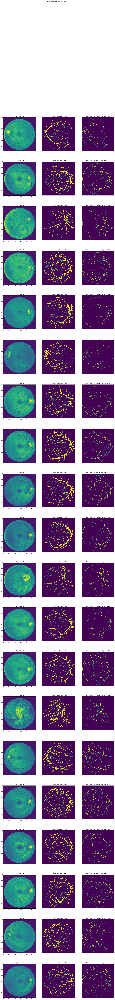

In [11]:
from skimage.filters import sato, frangi, hessian, meijering, median
fig, axs_list = plt.subplots(len(filenames_input_training), 3, figsize = (20, len(filenames_input_training) * 8))
fig.suptitle('Blood Vessel Segmentation Results')

imgs_segmented_training = np.zeros((584,565,20))
imgs_segmented_binary_training = np.zeros((584,565,20))
imgs_segmented_final_training = np.zeros((584,565,20))

for i, filename_input_training in enumerate(filenames_input_training):
    imgs_segmented_training[:,:,i] = segment_veins(data_preprocess(imgs_input_training)[:,:,i], sigma = 0.5, C = -4, blocksize = 15, reduce = True, min_size = 25)
    ret,imgs_segmented_binary_training[:,:,i] = cv2.threshold(imgs_segmented_training[:,:,i],.0001,255,cv2.THRESH_BINARY)
    imgs_mask_training[:,:,i][imgs_mask_training[:,:,i] == 255] = 1
    imgs_segmented_final_training[:,:,i] = np.multiply(imgs_segmented_binary_training[:,:,i], imgs_mask_training[:,:,i])

    axs = axs_list[i,0]
    axs.imshow(normalize_image(data_preprocess(imgs_input_training))[:,:,i])
    # axs.imshow(imgs_input_training)[:,:,:,i]
    axs.set_title(f'{filename_input_training}')

    axs = axs_list[i,1]
    # axs.imshow(normalize_image(data_preprocess(imgs_gtruth_training)[:,:,i]))
    # axs.imshow(data_preprocess(imgs_gtruth_training)[:,:,i])
    axs.imshow(imgs_gtruth_training[:,:,i])
    axs.set_title('Blobs image (Ground Truth)')
    axs.axis('off')

    axs = axs_list[i,2]
    im = axs.imshow(imgs_segmented_final_training[:,:,i])
    axs.set_title('Blobs image (only frangi, min_size = 25)')
    axs.axis('off')

## 10. Mask Creation

In [15]:
def inside_FOV(imgs_segmented_final_training):
    img_h = imgs_segmented_final_training.shape[0]
    img_w = imgs_segmented_final_training.shape[1]
    N_imgs = imgs_segmented_final_training.shape[2]
    imgs_segmented_final_insideFOV_training = np.zeros((584, 565, 20))
    
    for i in range(N_imgs):  
        for h in range(img_h):
            for w in range(img_w):
                if ((h - img_h/2)**2 + (w -  img_w/2)**2) < (250**2):
                    
                    imgs_segmented_final_insideFOV_training[h, w, i] = imgs_segmented_final_training[h, w, i]
                    
    imgs_segmented_final_training = np.asarray(imgs_segmented_final_training)
    return imgs_segmented_final_insideFOV_training

## 11. Apply Mask on the Segmented Images

In [16]:
imgs_segmented_final_insideFOV_training = inside_FOV(imgs_segmented_final_training)

## 12. Evaluation

In [20]:
# Load segmentation masks and ground truth masks
y_pred = imgs_segmented_final_insideFOV_training
y_true = imgs_gtruth_training

# Convert segmentation masks to binary
y_pred = (y_pred > 0.5).astype(np.uint8)
y_true = (y_true > 0.5).astype(np.uint8)

# Flatten masks for Sklearn metrics
y_true_flat = y_true.flatten()
y_pred_flat = y_pred.flatten()

# Calculate evaluation metrics
accuracy = accuracy_score(y_true_flat, y_pred_flat)
precision = precision_score(y_true_flat, y_pred_flat)
recall = recall_score(y_true_flat, y_pred_flat)
f1 = f1_score(y_true_flat, y_pred_flat)

# Calculate confusion matrix
tn, fp, fn, tp = confusion_matrix(y_true_flat, y_pred_flat).ravel()

# Print evaluation metrics and confusion matrix
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
print('True positive:', tp)
print('False positive:', fp)
print('True negative:', tn)
print('False negative:', fn)

Accuracy: 0.9395358528306461
Precision: 0.9460970431035385
Recall: 0.3175952178225644
F1-score: 0.47555232516110724
True positive: 180907
False positive: 10307
True negative: 6019278
False negative: 388708
